Importing Mask RCNN and other libararies required and downloading mask_rcnn_coco weights 


In [2]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt
# imports
from sys import path
from os import listdir
from xml.etree import ElementTree
from numpy import zeros
from numpy import asarray
from numpy import expand_dims
from numpy import mean
from matplotlib import pyplot as plt
import tensorflow as tf
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
sess = tf.Session(config=config)
import imgaug
from matplotlib.patches import Rectangle
%matplotlib inline


# Root directory of the project
ROOT_DIR = os.path.abspath("Mask_RCNN")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log
from mrcnn.utils import Dataset, compute_ap, extract_bboxes
from mrcnn.model import load_image_gt, mold_image, MaskRCNN
from mrcnn.visualize import display_instances

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join("logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

C:\Users\supremeoverlord\anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\supremeoverlord\anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\supremeoverlord\anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\supremeoverlord\anaconda3\lib\site-packages\tensorflow\python\frame

In [ ]:
Setup of configuration of for the model

In [4]:
class ShapesConfig(Config):
    """Configuration for training on the toy shapes dataset.
    Derives from the base Config class and overrides values specific
    to the toy shapes dataset.
    """
    # Give the configuration a recognizable name
    NAME = "fireDetectionTraining_cfg"

    # Train on 1 GPU and 8 images per GPU. We can put multiple images on each
    # GPU because the images are small. Batch size is 8 (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # background + 3 shapes

    # Use small images for faster training. Set the limits of the small side
    # the large side, and that determines the image shape.
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512

    # Use smaller anchors because our image and objects are small
    #RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)  # anchor side in pixels

    # Reduce training ROIs per image because the images are small and have
    # few objects. Aim to allow ROI sampling to pick 33% positive ROIs.
    #TRAIN_ROIS_PER_IMAGE = 32

    # Use a small epoch since the data is simple
    STEPS_PER_EPOCH = 1000

    # use small validation steps since the epoch is small
    VALIDATION_STEPS = 60
    
    BACKBONE = "resnet50"
    TRAIN_ROIS_PER_IMAGE = 200
    MAX_GT_INSTANCES = 50
    
    SAVE_BEST_ONLY = True
    DETECTION_MIN_CONFIDENCE = 0.95
    DETECTION_NMS_THRESHOLD = 0.05
    
config = ShapesConfig()
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.95
DETECTION_NMS_THRESHOLD        0.05
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE            

In [5]:
def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [ ]:
Extracting bounding box from the Image

In [6]:
	# extract bounding boxes from an annotation file
	def extract_boxes(filename):
        

		img = cv2.imread(filename,0)

		imgRGB = cv2.cvtColor(img.copy(), cv2.COLOR_GRAY2RGB)
		imgname = np.expand_dims(img.copy(), axis=-1)
		ctrs, _ = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        

		boxes = []              
		hi = img.shape[0]
		wi = img.shape[1]
		for ctr in ctrs:
			if  cv2.contourArea(ctr) > 6000:
				x, y, w, h = cv2.boundingRect(ctr)
				y2=y+h
				x2=x+w 
				boxes.append([y, x, y2, x2])
		return boxes,hi,wi

In [ ]:
Creating Train and Test Dataset

In [7]:
dataset_dir = ''

# class that defines and loads the fireDetection dataset
class fireDetectionDataset(Dataset):
	# load the dataset definitions
	def load_dataset(self, dataset_dir, is_train=True):
		# define one class
		self.add_class("dataset", 1, "Smoke")
		# define data locations
		images_dir = dataset_dir + 'Train/'
		mask_dir = dataset_dir + 'images3/'
  
		# find all images
		for filename in listdir(images_dir):
			# extract image id
			image_id = filename.split("_")[0]
			# skip bad images
			##if image_id in ['00090']:
				##continue

			# skip all images after 150 if we are building the train set
			##if is_train and int(image_id) >= 150:
				##continue

			# skip all images before 150 if we are building the test/val set
			##if not is_train and int(image_id) < 150:
				##continue

			img_path = images_dir + filename
			mask_path = mask_dir + filename.split("_")[0] + '_mask' + '.png'

			#img = cv2.imread(img_path)
			img_orig = cv2.imread(mask_path)

            
			# add to dataset if filename.split("_")[1].lower() == 'mask.png' and np.mean(img_orig) > 75 and img is not None and np.mean(img) > 0:  

			if img_orig is not None:
				self.add_image('dataset', image_id=image_id, path=img_path, mask=mask_path)
				#print(image_id)
	# extract bounding boxes from an annotation file


	# load the masks for an image
	def load_mask(self, image_id):
		# get details of image
		info = self.image_info[image_id]
  
		# define box file location
		path = info['mask']
		boxes,h,w = extract_boxes(path)
        
		#boxes, w, h = self.extract_boxes(path)
        
        
        
		# load Image
		#mask_image = cv2.imread(path)
		#gray_image = cv2.cvtColor(mask_image, cv2.COLOR_BGR2GRAY)
		#mask = np.expand_dims(gray_image, axis=-1)
		#boxes = extract_bboxes(path)
#		h = 1080
#		w = 1920

        
    # create one array for all masks, each on a different channel
		masks = zeros([h, w, len(boxes)], dtype='uint8')
  
		# create masks
		class_ids = list()
		for i in range(len(boxes)):
			box = boxes[i]
			row_s, row_e = box[0], box[2]
			col_s, col_e = box[1], box[3]
			masks[row_s:row_e, col_s:col_e, i] = 1
			class_ids.append(self.class_names.index('Smoke'))
            
		return masks, asarray(class_ids, dtype='int32')

	# load an image reference
	def image_reference(self, image_id):
		info = self.image_info[image_id]
		return info['path']

In [50]:
dataset_dir = ''

# class that defines and loads the fireDetection dataset
class fireDetectionDatasetTest(Dataset):
	# load the dataset definitions
	def load_dataset(self, dataset_dir, is_train=True):
		# define one class
		self.add_class("dataset", 1, "Smoke")
		# define data locations
		images_dir = dataset_dir + 'Test/'
		mask_dir = dataset_dir + 'images3/'
  
		# find all images
		for filename in listdir(images_dir):
			# extract image id
			image_id = filename.split("_")[0]
			# skip bad images
			##if image_id in ['00090']:
				##continue

			# skip all images after 150 if we are building the train set
			##if is_train and int(image_id) >= 150:
				##continue

			# skip all images before 150 if we are building the test/val set
			##if not is_train and int(image_id) < 150:
				##continue

			img_path = images_dir + filename
			mask_path = mask_dir + filename.split("_")[0] + '_mask' + '.png'

			#img = cv2.imread(img_path)
			img_orig = cv2.imread(mask_path)
			# add to dataset
			if img_orig is not None:
				self.add_image('dataset', image_id=image_id, path=img_path, mask=mask_path)
				#print(image_id)
	# extract bounding boxes from an annotation file



	# load the masks for an image
	def load_mask(self, image_id):
		# get details of image
		info = self.image_info[image_id]
  
		# define box file location
		path = info['mask']
		boxes,h,w = extract_boxes(path)
        
		#boxes, w, h = self.extract_boxes(path)
        
        
        
		# load Image
		#mask_image = cv2.imread(path)
		#gray_image = cv2.cvtColor(mask_image, cv2.COLOR_BGR2GRAY)
		#mask = np.expand_dims(gray_image, axis=-1)
		#boxes = extract_bboxes(path)
#		h = 1080
#		w = 1920

    # create one array for all masks, each on a different channel
		masks = zeros([h, w, len(boxes)], dtype='uint8')
  
		# create masks
		class_ids = list()
		for i in range(len(boxes)):
			box = boxes[i]
			row_s, row_e = box[0], box[2]
			col_s, col_e = box[1], box[3]
			masks[row_s:row_e, col_s:col_e, i] = 1
			class_ids.append(self.class_names.index('Smoke'))
            
		return masks, asarray(class_ids, dtype='int32')

	# load an image reference
	def image_reference(self, image_id):
		info = self.image_info[image_id]
		return info['path']

In [51]:
# prepare train set
train_set = fireDetectionDataset()
#colab_path = '/content/drive/My Drive/'
colab_path = ''
train_set.load_dataset(colab_path , is_train=True)
train_set.prepare()
print('Train: %d' % len(train_set.image_ids))

# prepare test/val set
test_set = fireDetectionDatasetTest()
test_set.load_dataset(colab_path , is_train=False)
test_set.prepare()
print('Test: %d' % len(test_set.image_ids))

Train: 5181
Test: 1513


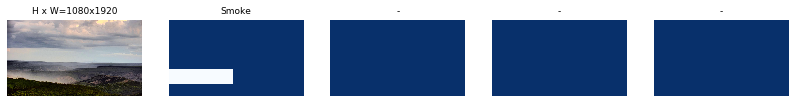

['BG', 'Smoke']
[0 1]
[1]
3055


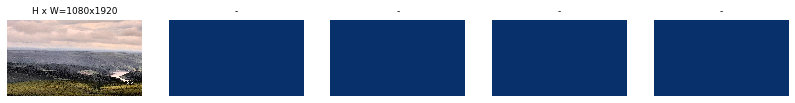

['BG', 'Smoke']
[0 1]
[]
4005


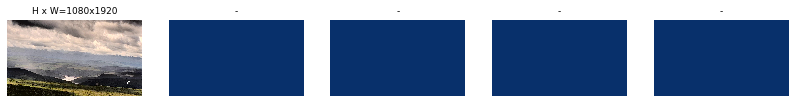

['BG', 'Smoke']
[0 1]
[]
1144


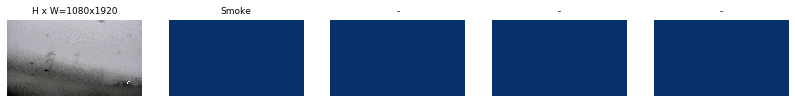

['BG', 'Smoke']
[0 1]
[1]
1787


In [12]:
# Load and display random samples
image_ids = np.random.choice(train_set.image_ids, 4)
for image_id in image_ids:
    image = train_set.load_image(image_id)
    mask, class_ids = train_set.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, train_set.class_names)
    print(train_set.class_names)
    print(train_set.class_ids)
    print(class_ids)
    print(image_id)

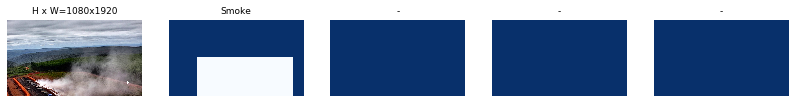

['BG', 'Smoke']
[0 1]
[1]
920


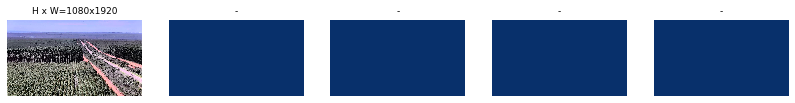

['BG', 'Smoke']
[0 1]
[]
970


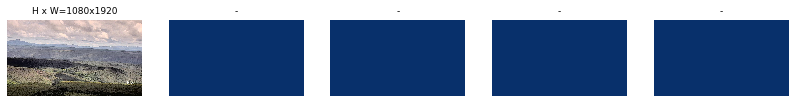

['BG', 'Smoke']
[0 1]
[]
561


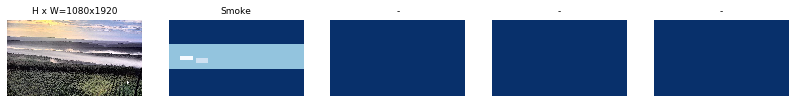

['BG', 'Smoke']
[0 1]
[1 1 1]
1253


In [13]:
# Load and display random samples
image_ids = np.random.choice(test_set.image_ids, 4)
for image_id in image_ids:
    image = test_set.load_image(image_id)
    mask, class_ids = test_set.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, test_set.class_names)
    print(test_set.class_names)
    print(test_set.class_ids)
    print(class_ids)
    print(image_id)

In [69]:
# Create model in training mode
model = modellib.MaskRCNN(mode="training", config=config,
                          model_dir=MODEL_DIR)


In [70]:
# Which weights to start with?
init_with = "coco"  # imagenet, coco, or last
#init_with = "last"
if init_with == "imagenet":
    model.load_weights(model.get_imagenet_weights(), by_name=True)
elif init_with == "coco":
    # Load weights trained on MS COCO, but skip layers that
    # are different due to the different number of classes
    # See README for instructions to download the COCO weights
    model.load_weights(COCO_MODEL_PATH, by_name=True,
                       exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", 
                                "mrcnn_bbox", "mrcnn_mask"])
elif init_with == "last":
    # Load the last model you trained and continue training
    model.load_weights(model.find_last(), by_name=True)

In [71]:
# GPU checks
print("Using GPU: " + str(tf.test.is_gpu_available()))
print("GPU name: " + str(tf.test.gpu_device_name()))

Using GPU: True
GPU name: /device:GPU:0


In [72]:
import tensorflow as tf
import datetime
%load_ext tensorboard

sess = tf.Session()

file_writer = tf.summary.FileWriter('Tensorboard\\', sess.graph)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [73]:

%load_ext tensorboard
from tensorflow.keras.callbacks import TensorBoard

tensorboard_callback = TensorBoard(log_dir="Tensorboard\\" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
model.train(train_set, test_set,
            learning_rate=config.LEARNING_RATE,
            epochs=30,
            custom_callbacks = [tensorboard_callback],
            layers='heads', 
            augmentation = imgaug.augmenters.Sequential([ 
                imgaug.augmenters.Fliplr(1), 
                imgaug.augmenters.Flipud(1), 
                imgaug.augmenters.Affine(rotate=(-45, 45)), 
                imgaug.augmenters.Affine(rotate=(-90, 90)), 
                imgaug.augmenters.Affine(scale=(0.5, 1.5))]))


Starting at epoch 0. LR=0.001

Checkpoint Path: logs\firedetectiontraining_cfg20200504T0122\mask_rcnn_firedetectiontraining_cfg_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistrib

C:\Users\supremeoverlord\anaconda3\lib\site-packages\tensorflow\python\ops\gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\supremeoverlord\anaconda3\lib\site-packages\tensorflow\python\ops\gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\supremeoverlord\anaconda3\lib\site-packages\tensorflow\python\ops\gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "




Epoch 1/30
1000/1000 [==============================] - 999s 999ms/step - loss: 1.6546 - val_loss: 1.7034
Epoch 2/30
1000/1000 [==============================] - 894s 894ms/step - loss: 1.4449 - val_loss: 1.8295
Epoch 3/30
1000/1000 [==============================] - 895s 895ms/step - loss: 1.4325 - val_loss: 2.1275
Epoch 4/30
1000/1000 [==============================] - 874s 874ms/step - loss: 1.3844 - val_loss: 1.6752
Epoch 5/30
1000/1000 [==============================] - 868s 868ms/step - loss: 1.3274 - val_loss: 1.6223
Epoch 6/30
1000/1000 [==============================] - 845s 845ms/step - loss: 1.3716 - val_loss: 1.7724
Epoch 7/30
1000/1000 [==============================] - 869s 869ms/step - loss: 1.3293 - val_loss: 1.9633
Epoch 8/30
1000/1000 [==============================] - 860s 860ms/step - loss: 1.3208 - val_loss: 1.7648
Epoch 9/30
1000/1000 [==============================] - 867s 867ms/step - loss: 1.3563 - val_loss: 1.7806
Epoch 10/30
1000/1000 [=====================

In [143]:
import numpy as np
numpy_history = np.array(history)

np.save('history_sim1', numpy_history)
item = np.load("history_sim1.npy",allow_pickle=True).item()

In [30]:
tensorboard --logdir Tensorboard/
tensorboard --logdir Github\Mask_RCNN\Tensorboard

# see http://localhost:6006/

ERROR: Timed out waiting for TensorBoard to start. It may still be running as pid 2900.

In [ ]:
Loading Testing Model Configuration

In [63]:
class InferenceConfig(ShapesConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")


#model_path = model.find_last()

model_path = 'logs/firedetectiontraining_cfg20200502T2340/mask_rcnn_firedetectiontraining_cfg_0019.h5'
# Load trained weights
print("Loading weights from ", model_path)

model.load_weights(model_path, by_name=True)

Loading weights from  logs/firedetectiontraining_cfg20200502T2340/mask_rcnn_firedetectiontraining_cfg_0019.h5
Re-starting from epoch 19


original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (14,)                 min:    0.00000  max: 1920.00000  float64
gt_class_id              shape: (1,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (1, 4)                min:  204.00000  max:  456.00000  int32
gt_mask                  shape: (512, 512, 1)         min:    0.00000  max:    1.00000  uint8


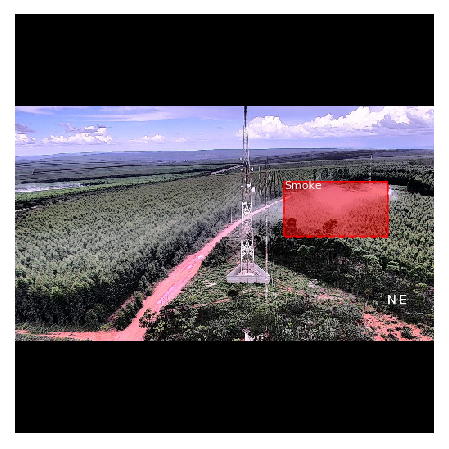

In [53]:

# Test on a random image
image_id = random.choice(test_set.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(test_set, inference_config, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            train_set.class_names, figsize=(8, 8))




original_image           shape: (256, 256, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (14,)                 min:    0.00000  max: 1920.00000  float64
gt_class_id              shape: (1,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (1, 4)                min:  102.00000  max:  228.00000  int32
gt_mask                  shape: (256, 256, 1)         min:    0.00000  max:    1.00000  uint8


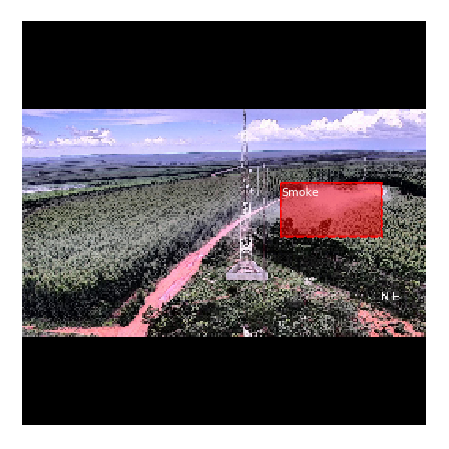

In [45]:

# Test on a random image
image_id = random.choice(test_set.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(test_set, inference_config, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            train_set.class_names, figsize=(8, 8))




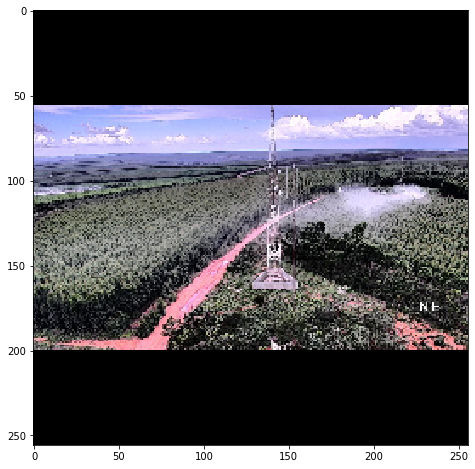

In [46]:
plt.figure(figsize=(8,8))
plt.imshow(original_image)


In [38]:
# plot a number of photos with ground truth and predictions
def plot_actual_vs_predicted(dataset, model, cfg, n_images=2):
	# load image and mask
	for i in range(n_images):
		# load the image and mask
		randomImage = random.choice(list(range(0,1000)))
		image = dataset.load_image(randomImage)
		mask, _ = dataset.load_mask(randomImage)

#changed i to random.choice(list(range(0,200)))
		# convert pixel values (e.g. center)
		scaled_image = mold_image(image, cfg)
        
		# convert image into one sample
		sample = expand_dims(scaled_image, 0)
        
		# make prediction
		yhat = model.detect(sample, verbose=0)[0]
        
		# define subplot
		pyplot.subplot(n_images, 2, i*2+1)
        
		# plot raw pixel data
		plotGraph=pyplot.imshow(image)

		pyplot.title('Actual')
        
		# plot masks
		for j in range(mask.shape[2]):
			pyplot.imshow(mask[:, :, j], cmap='gray', alpha=0.3)
            
		# get the context for drawing boxes
		pyplot.subplot(n_images, 2, i*2+2)
        
		# plot raw pixel data
		pyplot.imshow(image)
		pyplot.title('Predicted')
		ax = pyplot.gca()
        
		# plot each box
		for box in yhat['rois']:
			# get coordinates
			y1, x1, y2, x2 = box
            
			# calculate width and height of the box
			width, height = x2 - x1, y2 - y1
            
			# create the shape
			rect = Rectangle((x1, y1), width, height, fill=False, color='red')
            
			# draw the box
			ax.add_patch(rect)
            
	# show the figure

	pyplot.show()
 

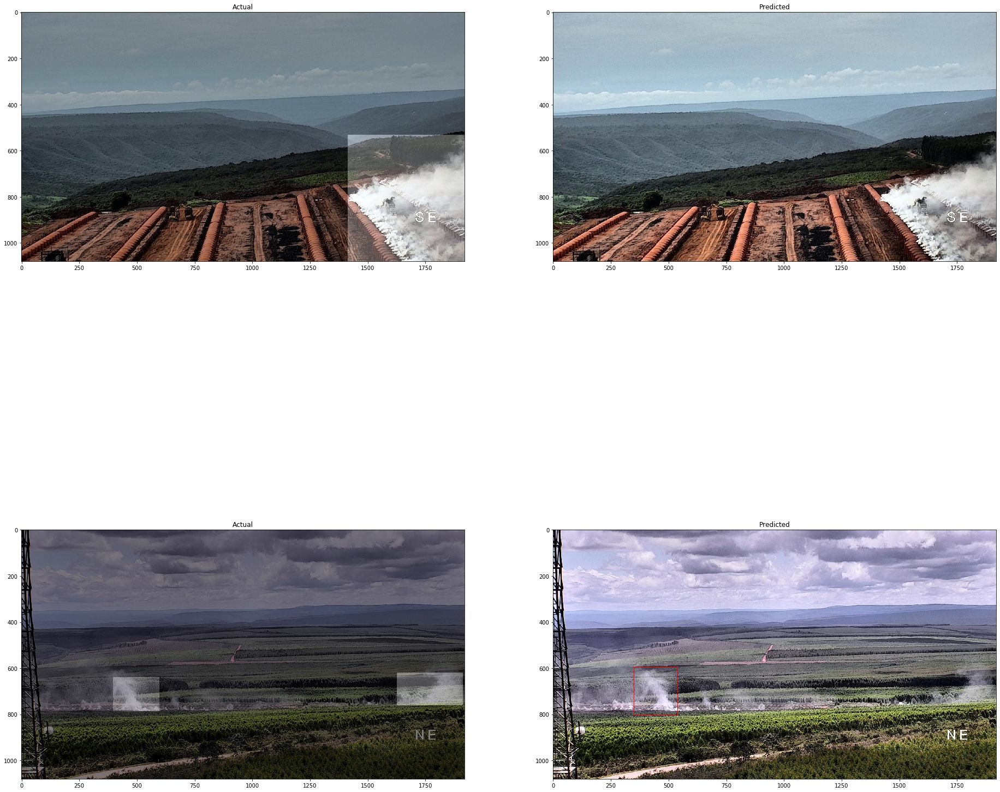

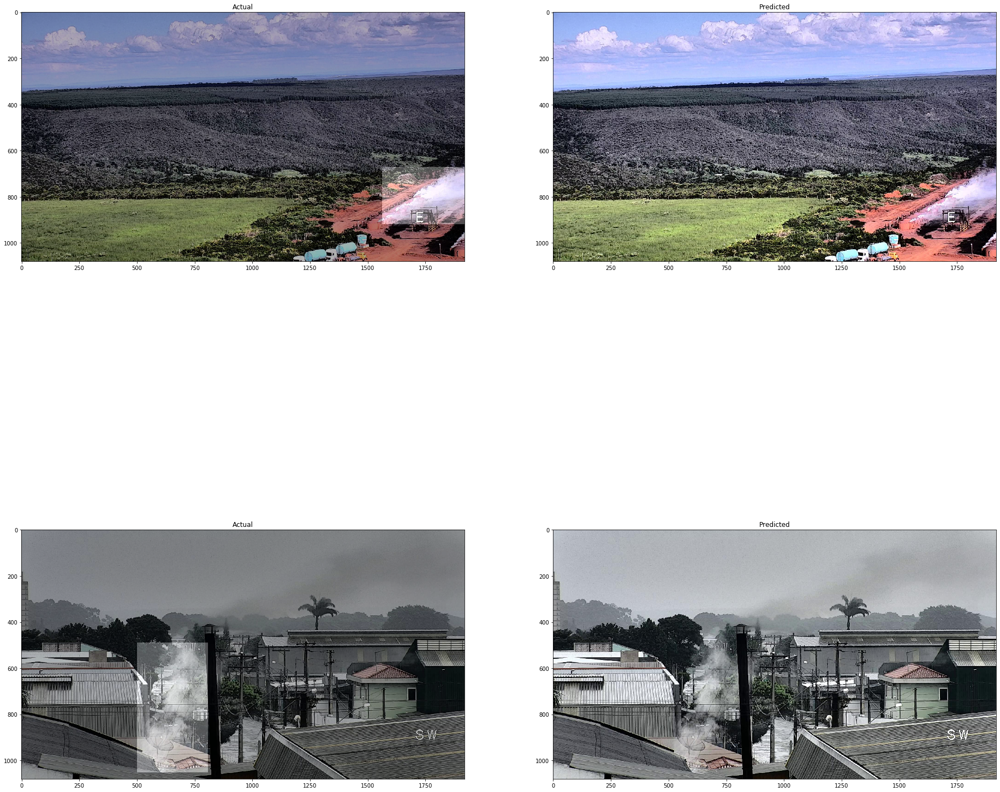

In [42]:
import matplotlib.pyplot as pyplot
cfg = InferenceConfig()
pyplot.figure(figsize=(32,32))
# plot predictions for train dataset
m=plot_actual_vs_predicted(train_set, model, cfg)
pyplot.figure(figsize=(32,32))
# plot predictions for test dataset
plot_actual_vs_predicted(test_set, model, cfg)

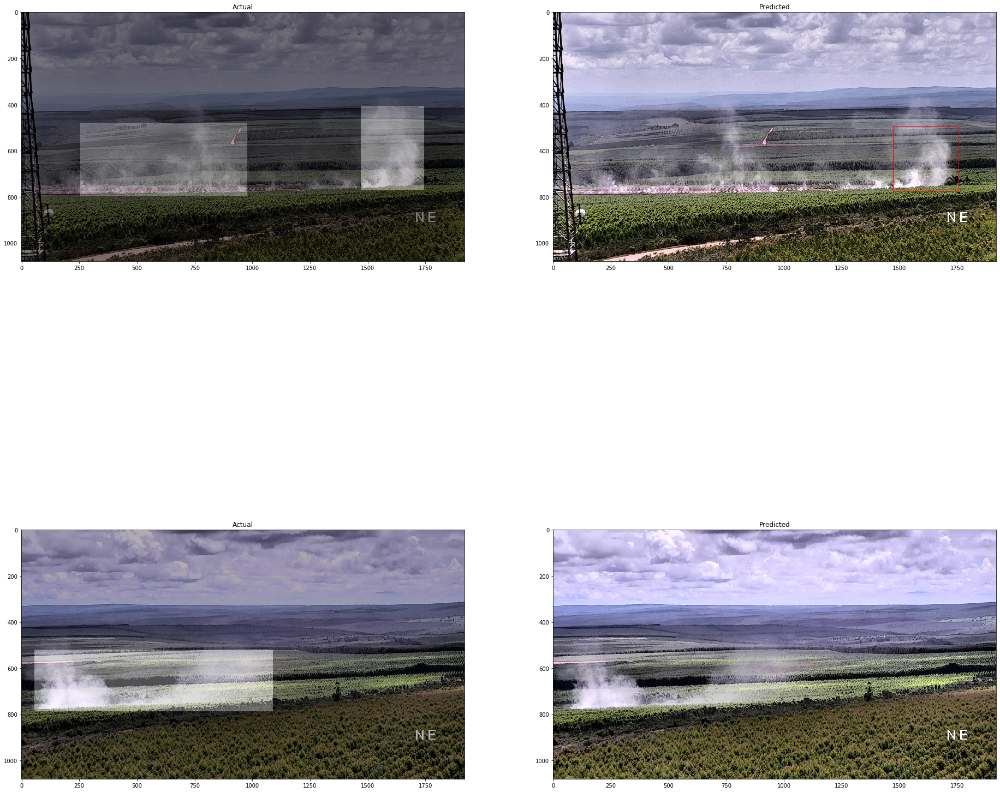

In [41]:
import matplotlib.pyplot as pyplot
cfg = InferenceConfig()

pyplot.figure(figsize=(32,32))
# plot predictions for test dataset
plot_actual_vs_predicted(test_set, model, cfg)

In [ ]:
# plot a number of photos with ground truth and predictions
def plot_actual_vs_predicted(dataset, model, cfg, n_images=1000):
	# load image and mask
            
	actual = []
	predicted = []
	Precision = []
	Recall = []

        
	for i in range(n_images):
		# load the image and mask
		image = dataset.load_image(i)
		mask, _ = dataset.load_mask(i)
		#print(np.sum(mask))

#changed i to random.choice(list(range(0,200)))
		# convert pixel values (e.g. center)
		scaled_image = mold_image(image, cfg)
        
		# convert image into one sample
		sample = expand_dims(scaled_image, 0)
        
		# make prediction
		yhat = model.detect(sample, verbose=0)[0]
		#print(np.sum(yhat['rois']))
		predicted.append(np.sum(yhat['rois']))

		actual.append(np.sum(mask))
    

	return predicted,actual
            
	# show the figure
#	print("Actual",actual)
#	print("Predicted",predicted)
#print("Precision",actual)
#print("Predicted",predicted)



In [ ]:
predicted,actual = plot_actual_vs_predicted(test_set, model, cfg)

In [ ]:
a = numpy.asarray(actual)
numpy.savetxt("actutal_actual.csv", a, delimiter=",")

In [ ]:
a = numpy.asarray(predicted)
numpy.savetxt("predicted_actual.csv", a, delimiter=",")